In [1]:
# !pip install transformers

In [2]:
# !pip install torch

In [3]:
# !pip install emoji

In [4]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import BertTokenizer, BertModel
import numpy as np
import pandas as pd
from rake_nltk import Rake
import re
import string
import torch
import nltk
nltk.download('punkt')


C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\macov\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [5]:
data = pd.read_csv("reports_data.csv", index_col=0)
data

,Report_Title,Report_Content
0,Arcade.xyz →,Arcade.xyz Findings & Analysis Report2023-10-...
1,Livepeer →,Livepeer Onchain Treasury Upgrade Findings & ...
2,Ondo Finance →,Ondo Finance Findings & Analysis Report2023-1...
3,Centrifuge →,Centrifuge Findings & Analysis Report2023-10-...
4,Canto →,veRWA Findings & Analysis Report2023-10-11Tab...
...,...,...
237,Marginswap →,Marginswap Findings & Analysis Report2021-05-...
238,ElasticDAO →,ElasticDAO Findings & Analysis Report2021-03-...
239,Slingshot Finance →,Slingshot Finance Findings & Analysis Report2...
240,Nested Finance →,Nested Finance contest Findings & Analysis Re...


In [6]:
def preprocess_text(text):
    # Remove HTML tags
    text = re.sub(r'<.*?>', '', text)
    
    # Remove CSS and JavaScript
    text = re.sub(r'<style.*?</style>|<script.*?</script>', '', text)
    
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    
    # Remove emojis
    text = text.encode('ascii', 'ignore').decode('ascii')
    
    # Apply basic preprocessing steps here
    preprocessed_text = text.lower() 
    
    return preprocessed_text

In [7]:
# Preprocessing
preprocessed_corpus = [preprocess_text(text) for text in data['Report_Content']]

In [8]:
# Tokenize and get BERT embeddings for each document
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')
embeddings = []
for text in preprocessed_corpus:
    inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True)
    with torch.no_grad():
        outputs = model(**inputs)
        pooled_output = outputs.pooler_output
    embeddings.append(pooled_output.numpy())

In [9]:
# Convert embeddings to numpy array
embeddings = np.array(embeddings).squeeze()


C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak

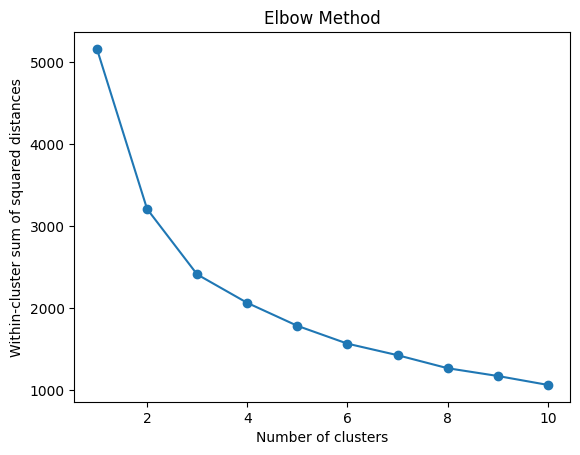

In [10]:
import matplotlib.pyplot as plt

# Assuming embeddings contain the data embeddings
inertias = []
for k in range(1, 11):  # Test different numbers of clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(embeddings)
    inertias.append(kmeans.inertia_)

# Plotting the Elbow Method
plt.plot(range(1, 11), inertias, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Within-cluster sum of squared distances')
plt.title('Elbow Method')
plt.show()

In [11]:
# Apply K-means clustering
k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
cluster_labels = kmeans.fit_predict(embeddings)


C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\macov\anaconda3\envs\lab\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


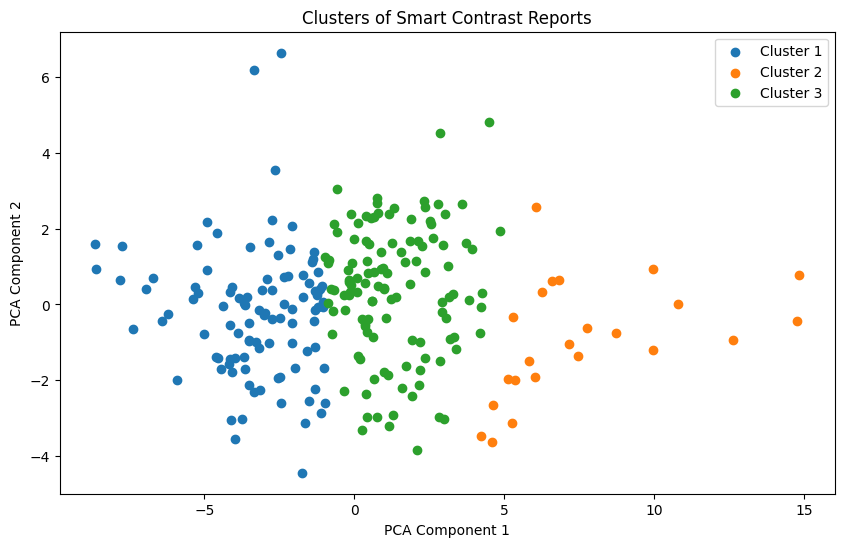

In [12]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Apply PCA to reduce dimensionality to 2D
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embeddings)

# Apply K-means clustering
k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
cluster_labels = kmeans.fit_predict(embeddings)

# Plot clusters
plt.figure(figsize=(10, 6))
for cluster_id in range(k):
    cluster_points = embeddings_2d[cluster_labels == cluster_id]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], label=f'Cluster {cluster_id + 1}')

plt.title('Clusters of Smart Contrast Reports')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.show()

In [13]:
# Keyword extraction within clusters
cluster_keywords = {}
for cluster_id in range(k):
    cluster_docs = data.loc[cluster_labels == cluster_id, 'Report_Content'].tolist()
    
    # Extract keywords using RAKE
    r = Rake()
    cluster_texts = '\n'.join(cluster_docs)
    r.extract_keywords_from_text(cluster_texts)
    keywords = r.get_ranked_phrases()
    cluster_keywords[cluster_id] = keywords

In [14]:
# Print identified vulnerabilities for each cluster
for cluster_id, keywords in cluster_keywords.items():
    print(f"Cluster {cluster_id + 1} - Potential vulnerabilities:")
    for keyword in keywords:
        print(keyword)
    print()

Cluster 1 - Potential vulnerabilities:
apply ”): pod n pon len op0 op1 op2 op3 op4 op5 op6 op7 op8 op9 total pod p0 10 615 0 0 0 0 0 0 0 0 0 615 p1 3 203 205 207 x x x x x x x 615 p2 6 208 0 233 0 207 0 x x x x 648 p3 9 61 62 69 70 65 69 61 60 54 x 571 p4 4 300 0 292 0 x x x x x x 592 p5 10 0 0 0 0 0 586 0 0 0 0 586 p6 2 602 0 x x x x x x x x 602 p7 7 93 93 100 99 76 74 78 x x x 613 p8 2 586 0 x x x x x x x x 586 p9 6 0 190 0 189 0 192 x x x x 571
hansfriese _adam 0x1f8b 0xc0ffee codingnamekiki c3phas ak1 christiankuri brgltd gogo tonisives peritoflores reyadmirado elku rolezn leosathya oyc_109 raymondfam djxploit waze martin robee respx asutorufos bnke0x0 ch0bu pprieditis bulej93 ret2basic ballx lucacez sikorico samatak franfran paludox0 dharma09 wagmi eierina 0xnazgul leos chatch d3e4 neumo minhtrng 0x1337 b2 erictee ne0n 8olidity jonatascm 0x85102 sahar ethledger lukris02 cryptostellar5 jujic sach1r0 bharg4v captainkay cryptonue jansenc slowmoses tnevler bobirichman cloudjunky diana

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




_feeder
_feeder
_feeder
_feeder
_feeder
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
token0
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
already
alr

received
received
received
received
received
received
received
received
received
received
received
received
received
received
received
received
received
received
received
received
received
received
minibratio
minibratio
minibratio
minibratio
minibratio
minibratio
minibratio
l132
l132
l132
l132
l132
l132
l132
l132
l11
l11
l11
l11
l11
l11
l11
l11
l11
l11
l11
inonfungiblepositionmanager
inonfungiblepositionmanager
inonfungiblepositionmanager
inonfungiblepositionmanager
inonfungiblepositionmanager
inonfungiblepositionmanager
inonfungiblepositionmanager
inonfungiblepositionmanager
inonfungiblepositionmanager
inonfungiblepositionmanager
dueout
dueout
dueout
dueout
dueout
dueout
dueout
charactermodifier
charactermodifier
charactermodifier
charactermodifier
charactermodifier
charactermodifier
charactermodifier
charactermodifier
charactermodifier
assertgovernanceapproved
assertgovernanceapproved
assertgovernanceapproved
assertgovernanceapproved
assertgovernanceapproved
builder
builder
builder
b

charge
charge
charge
charge
charge
charge
charge
charge
charge
charge
charge
charge
charge
charge
charge
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
likely
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote
vote

screens
screens
pushed
pushed
pushed
pushed
pushed
pushed
pushed
pushed
pushed
nounsauctionhousefork
nounsauctionhousefork
nounsauctionhousefork
nounsauctionhousefork
nounsauctionhousefork
nounsauctionhousefork
nounsauctionhousefork
nounsauctionhousefork
nounsauctionhousefork
nounsauctionhousefork
liquiditybasedtwap
liquiditybasedtwap
liquiditybasedtwap
liquiditybasedtwap
liquiditybasedtwap
liquiditybasedtwap
liquiditybasedtwap
liquiditybasedtwap
liquiditybasedtwap
eladmallel
eladmallel
eladmallel
eladmallel
eladmallel
eladmallel
eladmallel
eladmallel
eladmallel
drawingtokenendid
drawingtokenendid
drawingtokenendid
drawingtokenendid
drawingtokenendid
drawingtokenendid
drawingtokenendid
drawingtokenendid
_tokenpath
_tokenpath
_tokenpath
_tokenpath
_tokenpath
_tokenpath
_tokenpath
_tokenpath
_tokenpath
_tokenpath
_tokenbscale
_tokenbscale
_tokenbscale
_tokenbscale
_tokenbscale
_tokenbscale
_tokenbscale
_tokenbscale
_tokenascale
_tokenascale
_tokenascale
_tokenascale
_tokenascale
_tokenas

In [15]:
  # Create an empty list to store cluster data
cluster_data = []

# Iterate over cluster_keywords dictionary
for cluster_id, keywords in cluster_keywords.items():
    # Display top 5 keywords for each cluster
    top_keywords = ", ".join(keywords[:5])
    # Append cluster data to the list
    cluster_data.append({'Cluster': cluster_id + 1, 'Potential Vulnerabilities': top_keywords})

# Convert list of dictionaries to DataFrame
cluster_df = pd.DataFrame(cluster_data)

# Display DataFrame
print(cluster_df)

   Cluster                          Potential Vulnerabilities
0        1  apply ”): pod n pon len op0 op1 op2 op3 op4 op...
1        2  avg 95 105 100 avg 57 57 57 ceil 82 117 101 ce...
2        3  calls │ ├╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌╌...


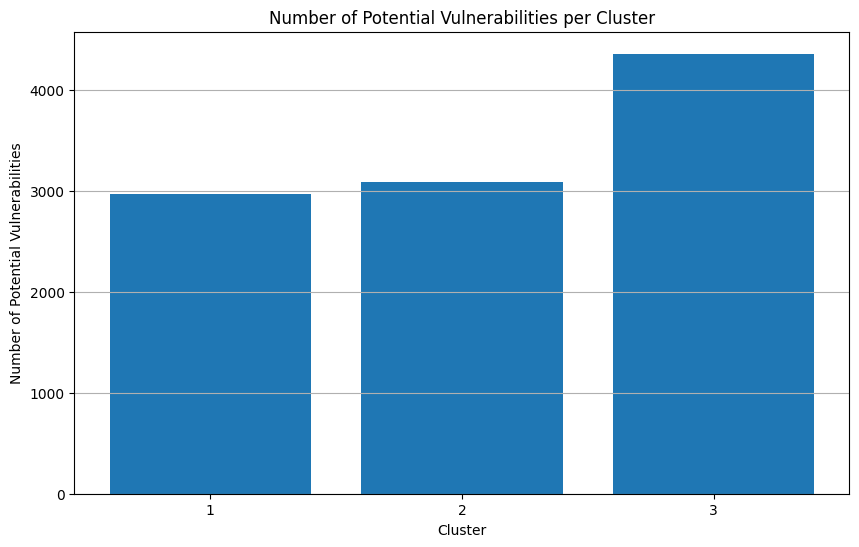

In [16]:
import matplotlib.pyplot as plt

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(cluster_df['Cluster'], cluster_df['Potential Vulnerabilities'].str.len())
plt.xlabel('Cluster')
plt.ylabel('Number of Potential Vulnerabilities')
plt.title('Number of Potential Vulnerabilities per Cluster')
plt.xticks(cluster_df['Cluster'])
plt.grid(axis='y')

# Save the plot as a PNG file
plt.savefig('potential_vulnerabilities_per_cluster.png')

# Show the plot
plt.show()

In [17]:
from collections import Counter

# Step 1: Frequency Analysis
all_keywords = [keyword for keywords in cluster_keywords.values() for keyword in keywords]
keyword_freq = Counter(all_keywords)

# Step 2: Severity Assessment (dummy example, replace with your logic)
severity_scores = {keyword: len(keyword.split()) for keyword in keyword_freq.keys()}

# Step 3: Identify Common Vulnerabilities (threshold can be adjusted)
common_vulnerabilities = [keyword for keyword, freq in keyword_freq.items() if freq > 1]

# Step 4: Identify Most Dangerous Vulnerabilities (adjust threshold based on severity)
most_dangerous_vulnerabilities = [keyword for keyword, severity in severity_scores.items() if severity > 5]



In [18]:
print("Common Vulnerabilities:")
print(common_vulnerabilities)

Common Vulnerabilities:
['1 == 1 seconds 1 minutes == 60 seconds 1 hours == 60 minutes 1 days == 24 hours 1 weeks == 7 days contracts', '// transaction cost 21558 gas // execution cost 286 gas function tt_public () public returns', '586', '// deploy contracts deploytestsystem (); initpool (); initexchange (); preparepool (); exchange', 'reentrancy ==================== ===== called takemanagementandperformancefees () ===== entered takefees () current assets', '│ │ │ ├─', 'deploytestsystem (); initpool (); initexchange (); preparepool (); setassetprice', '_msgsender (), amtrtoken ); 571', '615', "// one eternity later ... await advancetime (' 123456789123456789 ') //", 'getx (), setx (), deletex (), addx ()', '│ │ └─ ←', 'placing order --------------- order book --------------- [-] asks index 0', 'tofunmi', 'ne0n', 'ethledger', 'dimson', 'cr4ckm3', 'matchonetooneorders (), matchonetomanyorders (), matchorders (), takemultipleoneorders (), takeorders ()]', 'log ("\\ n ===== called takeman

In [19]:
print("\nMost Dangerous Vulnerabilities:")
print(most_dangerous_vulnerabilities)


Most Dangerous Vulnerabilities:
['apply ”): pod n pon len op0 op1 op2 op3 op4 op5 op6 op7 op8 op9 total pod p0 10 615 0 0 0 0 0 0 0 0 0 615 p1 3 203 205 207 x x x x x x x 615 p2 6 208 0 233 0 207 0 x x x x 648 p3 9 61 62 69 70 65 69 61 60 54 x 571 p4 4 300 0 292 0 x x x x x x 592 p5 10 0 0 0 0 0 586 0 0 0 0 586 p6 2 602 0 x x x x x x x x 602 p7 7 93 93 100 99 76 74 78 x x x 613 p8 2 586 0 x x x x x x x x 586 p9 6 0 190 0 189 0 192 x x x x 571', 'hansfriese _adam 0x1f8b 0xc0ffee codingnamekiki c3phas ak1 christiankuri brgltd gogo tonisives peritoflores reyadmirado elku rolezn leosathya oyc_109 raymondfam djxploit waze martin robee respx asutorufos bnke0x0 ch0bu pprieditis bulej93 ret2basic ballx lucacez sikorico samatak franfran paludox0 dharma09 wagmi eierina 0xnazgul leos chatch d3e4 neumo minhtrng 0x1337 b2 erictee ne0n 8olidity jonatascm 0x85102 sahar ethledger lukris02 cryptostellar5 jujic sach1r0 bharg4v captainkay cryptonue jansenc slowmoses tnevler bobirichman cloudjunky diana 

In [20]:
# Define regex patterns to filter out noise
code_snippet_pattern = r'\bfunction\b|\bfor\b|\bif\b|\belse\b|\bwhile\b|\btry\b|\bcatch\b|\bimport\b|\breturn\b|\bdef\b|\bclass\b|\bvoid\b'
comment_pattern = r'\/\/.*'  # Match single-line comments starting with '//'

# Filter out noise using regex patterns
filtered_vulnerabilities = [vulnerability for vulnerability in common_vulnerabilities if not re.search(code_snippet_pattern, vulnerability) and not re.search(comment_pattern, vulnerability)]

# Display filtered vulnerabilities
for vulnerability in filtered_vulnerabilities:
    print(vulnerability)

1 == 1 seconds 1 minutes == 60 seconds 1 hours == 60 minutes 1 days == 24 hours 1 weeks == 7 days contracts
586
reentrancy ==================== ===== called takemanagementandperformancefees () ===== entered takefees () current assets
│ │ │ ├─
deploytestsystem (); initpool (); initexchange (); preparepool (); setassetprice
_msgsender (), amtrtoken ); 571
615
getx (), setx (), deletex (), addx ()
│ │ └─ ←
placing order --------------- order book --------------- [-] asks index 0
tofunmi
ne0n
ethledger
dimson
cr4ckm3
matchonetooneorders (), matchonetomanyorders (), matchorders (), takemultipleoneorders (), takeorders ()]
log ("\ n ===== called takemanagementandperformancefees () ====="); newvault
10 ** 18 ). transact () print (' received liquidity ', pool
encode_abi ([" address []"," uint136 []"," uint256 "],
p9
571 status
│ │ ├─
c4 wardens summary scope severity criteria high risk findings medium risk findings
watchdogs
571
sender != holder && receiver != holder && receiver != operator &&

notice change
uniswapv3 ’
151 instances
relayer network
calling increasereserve
base contract
individual tests
starting price
onlyclearinghouse 137
actually withdraw
enough prizes
would give
canonical token
reward payouts
versions called
certorainc received
yul functions
token even
gas paid
following formula
secondary seller
made external
one contract
lower limit
additional note
time goes
prevent dos
previous observation
previous draw
uint256 unity
unanimous votes
second time
wfcash contract
synthethix contract
invescrow contract
contract plays
address releaseto
address mtokencollateral
address _voter
address _governance
address _consideration
address _assetid
_governance address
line 68
0 passed
], startingcounter
withdrawal process
asset cheap
rewards accrued
accrued rewards
l479 file
implement eip4626
also better
lose reward
created using
frontrun submitted
== msg
taker erc20
1 12
uint r1
value parameter
bytes32 root
since amount
recommend validating
rewards calculation
checking whe

value back
address withdrawproxyifnearboundary
address token_
address oldadmin
address oldaccount
address _vamm
address _stakingtoken
address _newaddress
address _line
address _distributor
given back
quite similar
certain conditions
maximum loss
split voting
block times
nft owner
borrow controller
approved receiver
=>
frozen state
uint256 counter
0 thus
0 bathassetinstance
0 amount1actual
_newmember ))
adopted asset
unfortunate event
estimate times
dev user
sol files
]. proof
always consistent
uint256 mincollateral
zero since
premium fee
disabled submitted
token pool
pool token
lokithe5th
l68 68
following particleexchange
), abi
]. rewarded
would end
vtoken contract
previously mentioned
better readability
allow user
await dmutetoken
medium due
ids array
75 require
holding collateral
sol 286
blocks users
contract poc
fees received
would lead
uint128 currencyid
compound ’
ierc20 rewardtoken
revert invalidrequest
fed data
cause funds
25 instances
cmichel certorainc
variables incremented
p

In [21]:
# Define a list of keywords indicating potential vulnerabilities
vulnerability_keywords = ['sql injection', 'xss', 'cross-site scripting', 'buffer overflow', 'command injection', 'path traversal', 'security misconfiguration', 'insecure deserialization', 'unvalidated input', 'authentication bypass', 'privilege escalation', 'remote code execution', 'unauthorized access']

# Filter potential vulnerabilities based on keyword matches
potential_vulnerabilities = []
for keyword in vulnerability_keywords:
    matches = [vulnerability for vulnerability in common_vulnerabilities if keyword in vulnerability.lower()]
    potential_vulnerabilities.extend(matches)

# Remove duplicate entries
potential_vulnerabilities = list(set(potential_vulnerabilities))

# Display identified potential vulnerabilities
for vulnerability in potential_vulnerabilities:
    print(vulnerability)

xss attack
xss


In [22]:
# Define a dictionary of severity scores for each vulnerability
severity_scores = {
    'sql injection': 10,
    'xss': 9,
    'cross-site scripting': 9,
    'buffer overflow': 8,
    'command injection': 8,
    'path traversal': 7,
    'security misconfiguration': 7,
    'insecure deserialization': 7,
    'unvalidated input': 6,
    'authentication bypass': 6,
    'privilege escalation': 6,
    'remote code execution': 10,
    'unauthorized access': 7,
    'session fixation': 8,
    'csrf': 8,
    'clickjacking': 7,
    'xml external entity': 9,
    'injection attacks': 8,
    'information disclosure': 7,
    'race condition': 8,
    'open redirect': 7,
    'broken authentication': 8,
    'sqli': 9,
    'ldap injection': 8,
    'xml injection': 8,
    'code injection': 9,
    'xpath injection': 8,
    'file inclusion': 8,
    'dos': 7,
    'memory corruption': 9,
    'buffer overrun': 8,
    'format string attack': 8,
    'directory traversal': 7,
    'shell injection': 8,
    'host header injection': 7,
    'parameter tampering': 7,
    'click fraud': 6,
    'session hijacking': 8,
    'session fixation': 8,
    'user enumeration': 7,
    'arbitrary file upload': 8,
    'dll injection': 9,
    'click fraud': 6,
    'session hijacking': 8,
    'session fixation': 8,
    'user enumeration': 7,
    'arbitrary file upload': 8,
    'dll injection': 9,
    'replay attack': 7,
    'man-in-the-middle attack': 8,
    'side-channel attack': 8,
    'smurf attack': 7,
    'icmp flood': 7,
    'dns amplification attack': 7,
    'botnet': 8,
    'trojan horse': 9,
    'worm': 8,
    'rootkit': 9,
    'ransomware': 9,
    'spyware': 8,
    'adware': 7,
    'keylogger': 8,
    'logic bomb': 8,
    'backdoor': 8,
    'zero-day exploit': 9,
    'brute force attack': 8,
    'dictionary attack': 8,
    'credential stuffing': 7,
    'phishing': 7,
    'spear phishing': 8,
    'whaling': 9,
    'vishing': 7,
    'smishing': 7,
    'watering hole attack': 8,
    'drive-by download': 7,
    'malvertising': 7,
    'social engineering': 8,
    'eavesdropping': 7,
    'shoulder surfing': 6,
    'data breach': 7,
    'identity theft': 8,
    'spoofing': 7,
    'impersonation': 8,
    'sniffing': 7,
    'packet sniffing': 7,
    'arp spoofing': 7,
    'ip spoofing': 7,
    'mac spoofing': 7,
    'url spoofing': 7,
    'pharming': 7,
    'mitm attack': 8,
    'ddos': 8,
    'distributed denial of service': 8,
    'udp flood': 7,
    'tcp syn flood': 7,
    'http flood': 7,
    'layer 7 ddos': 8,
    'application layer attack': 8,
    'ransomware': 9,
    'cryptojacking': 8,
    'iot botnet': 8,
    'sql injection': 10,
    'xss': 9,
    'cross-site scripting': 9,
    'buffer overflow': 8,
    'command injection': 8,
    'path traversal': 7,
    'security misconfiguration': 7,
    'insecure deserialization': 7,
    'unvalidated input': 6,
    'authentication bypass': 6,
    'privilege escalation': 6,
    'remote code execution': 10,
    'unauthorized access': 7,
    'session fixation': 8,
    'csrf': 8,
    'clickjacking': 7,
    'xml external entity': 9,
    'injection attacks': 8,
    'information disclosure': 7,
    # Add more vulnerabilities and their severity scores as needed
}


# Filter potential vulnerabilities based on keyword matches
potential_vulnerabilities = []
for keyword in severity_scores.keys():
    matches = [vulnerability for vulnerability in common_vulnerabilities if keyword in vulnerability.lower()]
    potential_vulnerabilities.extend(matches)

# Remove duplicate entries
potential_vulnerabilities = list(set(potential_vulnerabilities))

# Sort potential vulnerabilities by severity score
potential_vulnerabilities.sort(key=lambda x: severity_scores.get(x.lower(), 0), reverse=True)

# Select the top 30 most dangerous vulnerabilities
top_30_most_dangerous_vulnerabilities = potential_vulnerabilities[:30]

# Display the top 30 most dangerous vulnerabilities
for vulnerability in top_30_most_dangerous_vulnerabilities:
    print(vulnerability)

xss
memory corruption
backdoor
race condition
ddos
social engineering
dos
replay attack
phishing
cudos erc20 funds sent
dos vault ’
open todos submitted
dos would
dosed submitted
merge replay attack
assessed type dos asselstine
assessed type dos chechu
chain replay attack
perform dos
stake () dos
chain replay attacks
possible dos attack using dust
dos attacked
potential stake () dos
vmaia vault dos
open todos code architecture
cudos cosmos chain
temporary dos
dos private party
_dosherx function


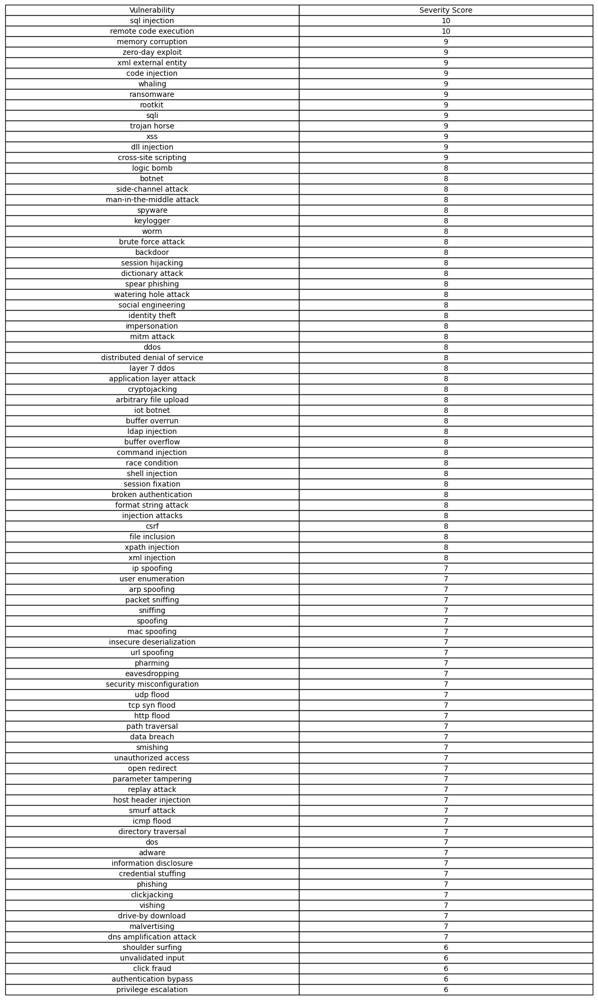

In [23]:
# Create a DataFrame from the dictionary
df = pd.DataFrame(list(severity_scores.items()), columns=['Vulnerability', 'Severity Score'])

# Sort the DataFrame by Severity Score in descending order
df = df.sort_values(by='Severity Score', ascending=False)

# Plotting the table
plt.figure(figsize=(12, 8))  # Increase figure size
table = plt.table(cellText=df.values, colLabels=df.columns, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(10)  # Adjust font size for better readability
table.scale(1.2, 1.2)  # Scale the table for better fit
plt.axis('off')  # Turn off axis

# Save the plot as a PNG file
plt.savefig('vulnerability_severity_scores.png', bbox_inches='tight')

# Show the plot
plt.show()

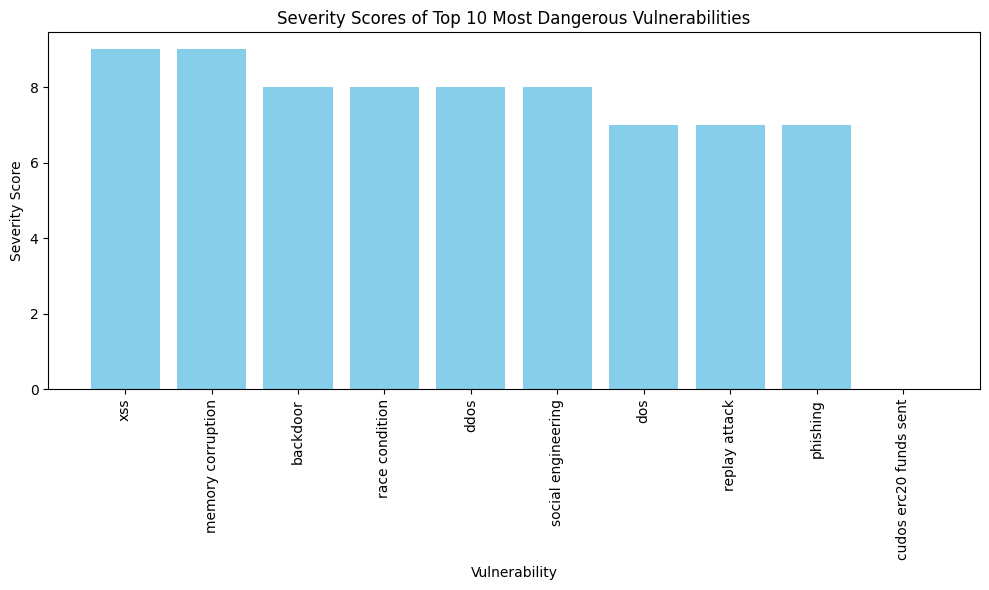

In [26]:
import matplotlib.pyplot as plt

# Get the severity scores for the top 20 most dangerous vulnerabilities
top_10_vulnerabilities = potential_vulnerabilities[:10]
severity_scores_list = [severity_scores.get(vulnerability.lower(), 0) for vulnerability in top_10_vulnerabilities]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(range(len(top_10_vulnerabilities)), severity_scores_list, color='skyblue')
plt.xlabel('Vulnerability')
plt.ylabel('Severity Score')
plt.title('Severity Scores of Top 10 Most Dangerous Vulnerabilities')
plt.xticks(range(len(top_10_vulnerabilities)), top_10_vulnerabilities, rotation=90)
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig('severity_scores_top_10_vulnerabilities.png')

# Show the plot
plt.show()


